# KMeans Segmentation Algorithm

Populating the interactive namespace from numpy and matplotlib
Displaying outs


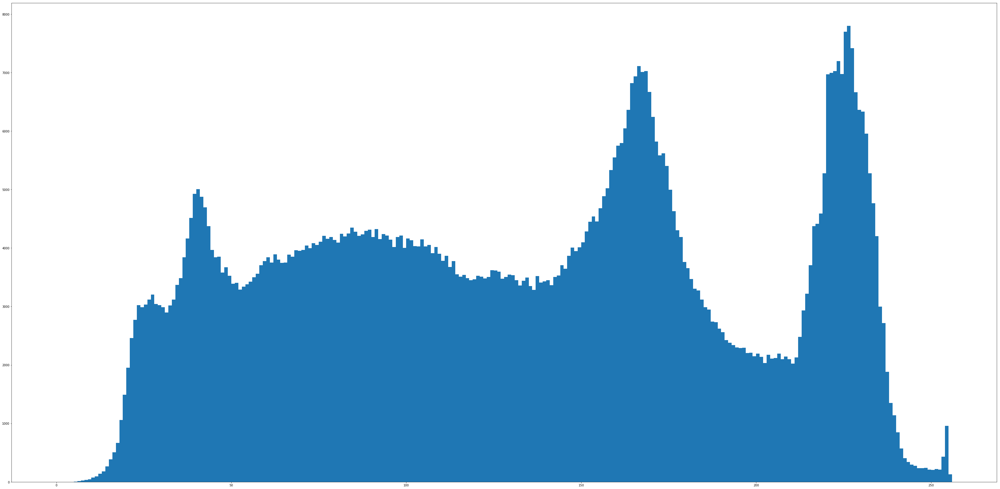

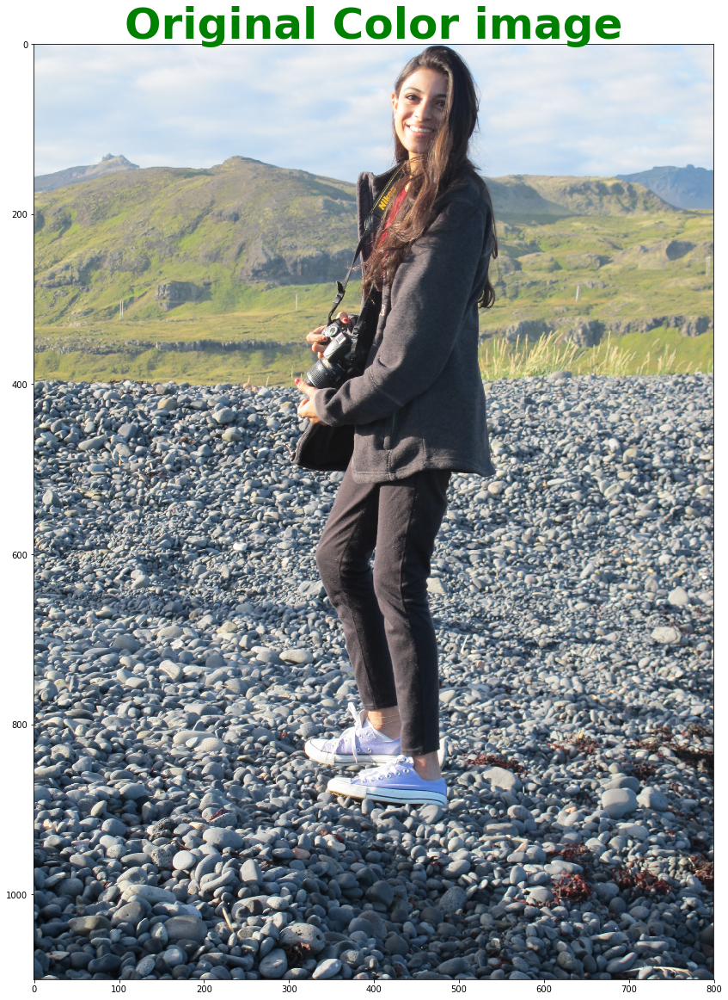

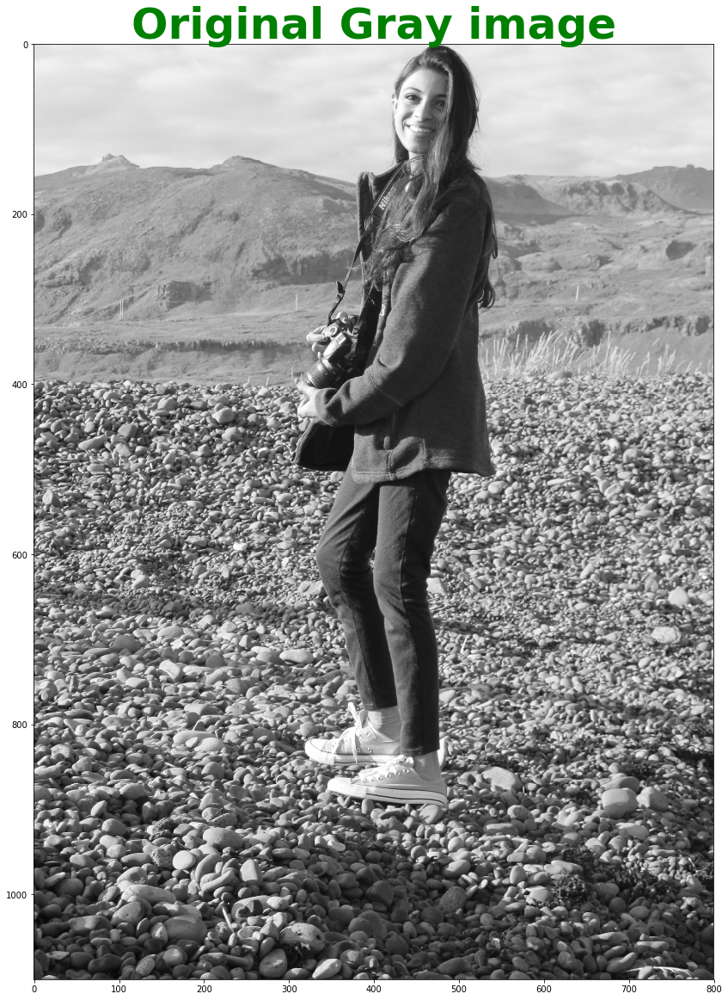

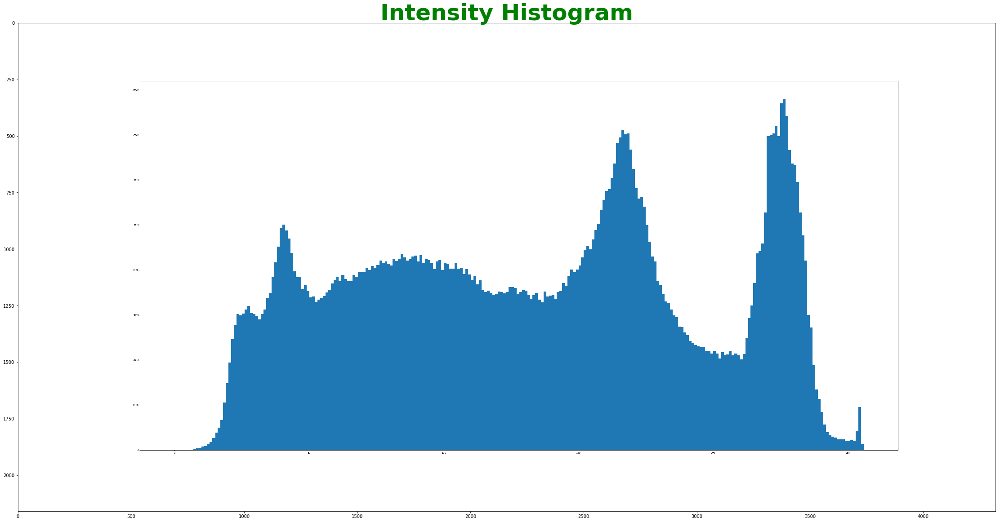

In [27]:
'''
This file has the code for QUESTION 2 of the assignment
'''
import cv2
from matplotlib import pyplot as plt
import numpy as np

class Segment:
    DEBUG = True
    outputImages = []
    FONT_SIZE = 50

    def resizeImage(self, image, dbug=DEBUG):
        if dbug:
            image = cv2.resize(image, (800, 1100))
        else:
            image = cv2.resize(image, (800, 1100))
        return image

    def displayImage(self, img):
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)

    def displayImages(self, images):
        print("Displaying outs")
        for im in images:
            ima = im[0]
            if len(ima.shape) >2:
                ima = cv2.cvtColor(ima, cv2.COLOR_BGR2RGB)
            else:
                ima = cv2.cvtColor(ima,cv2.COLOR_GRAY2RGB)
            plt.figure(figsize=(80,20))
            plt.title(im[1], fontsize=self.FONT_SIZE, fontweight='bold', color="green")
            plt.imshow(ima)

    def getImages(self,path):

        im_clr = self.resizeImage(cv2.imread(path))
        self.outputImages.append((im_clr, "Original Color image"))
        im_gray = self.resizeImage(cv2.imread(path, 0))
        self.outputImages.append((im_gray, "Original Gray image"))
        return im_gray,im_clr

    def kMeans(self,image,features,k):
        #First create a cluster of size k
        groups = [(i,j) for i,j in zip(range(k),range(k))]

        #then initialize the centroids with k random intensities
        print "init centroids"


    def gausMix(self,image,features,k):
        pass

    def meanShift(self,image,features):
        pass

    def getIntensityFeatures(self,im):
        '''
        This function will loop through each pixel in the image and then get the key features
        :return:
        '''
        bins = np.histogram(im,range(256))
        intensityFeatures = np.zeros(im.shape)

        if self.DEBUG:
            plt.hist(im.ravel(), 256, [0, 256]);
            plt.autoscale()
            plt.savefig("./images/histogram.png")
            hist = cv2.imread("./images/histogram.png")
            self.outputImages.append((hist,"Intensity Histogram"))

        return bins

    def main(self):
        '''
        This is the main function for the segmentation class
        :return:i
        '''
        # First get the images
        path = "./images/sarina.jpg"
        im_gray,im_color = self.getImages(path)

        #Then get the feature spaces for Intensity and RGB
        intensity_features = self.getIntensityFeatures(im_gray)

        #Then do meanshift, kmeans and gauMix

        if self.DEBUG:
           self.displayImages(self.outputImages)

%pylab inline
%matplotlib inline
plt.rcParams['figure.figsize'] = (60, 30)
c = Segment()
c.main()


# Panorama Stitching

Populating the interactive namespace from numpy and matplotlib
Finding the right image keypoints
Finding the left image keypoints
Finding matches between images
done
Displaying outs


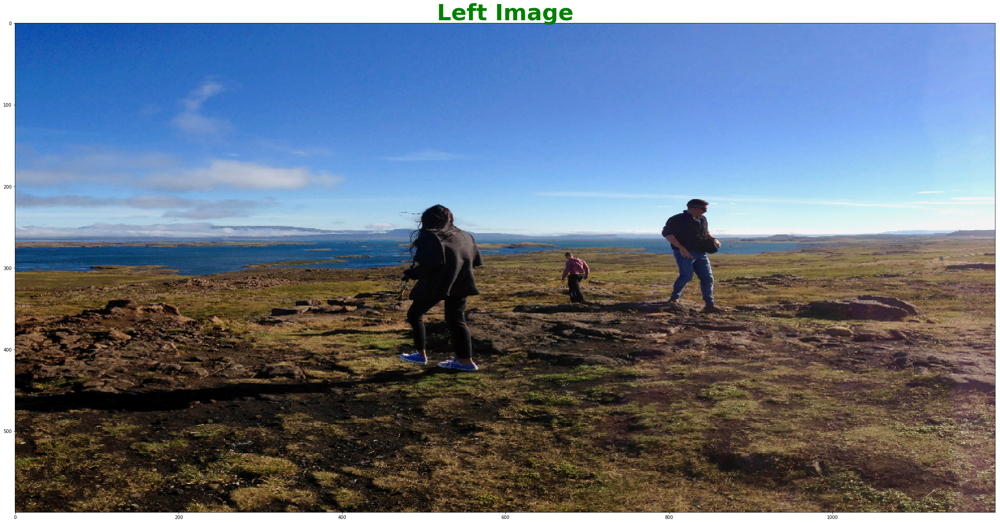

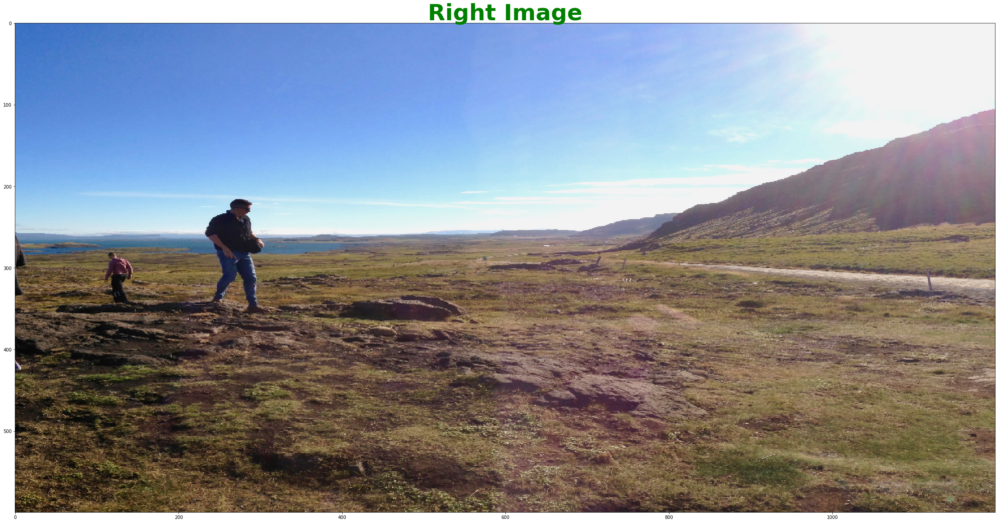

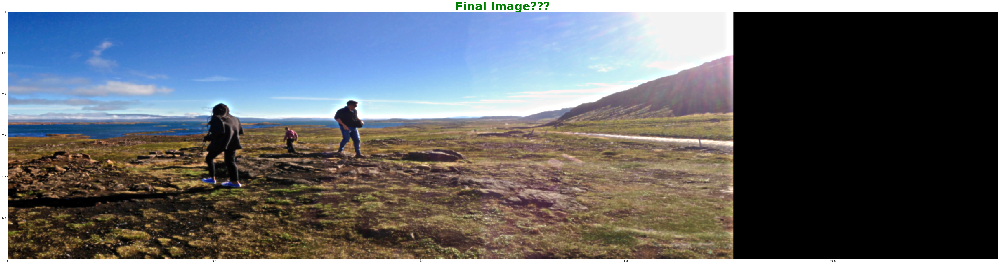

In [10]:
"""
    NOTES:
    CITATIONS:
        -MCgill OpenCV Tutorial Code for the Ransac and ouput limits functions
"""
'''
    LIBRARIES
'''
from tqdm import tnrange
from time import sleep
import cv2
from matplotlib import pyplot as plt
import os
import numpy as np
'''
    MAGIC VARIABLES
'''



class Panorama:
    DEBUG = False
    t = None
    FONT_SIZE = 50
    outputImages = []
    kp1 = []
    des1 = []
    kp2 = []
    des2 = []
    matches = []
    homographyMatrix = []
    finalShape = (0, 0)
    rightGaussianPyramid = []
    leftGaussianPyramid = []

    leftLaplacianPyramid = []
    rightLaplacianPyramid = []

    def resizeImage(self, image, dbug=DEBUG):
        if dbug:
            image = cv2.resize(image, (1200, 600))
        # image = cv2.resize(image, (120, 160))
        # image = cv2.resize(image, (1920, 2560))
        else:
#             image = cv2.resize(image, (2400, 1200))
            image = cv2.resize(image, (1200, 600))
        return image

    def displayImage(self, img):
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.imshow(img)

    def displayImages(self, images):
        print("Displaying outs")
        for im in images:
            ima = im[0]
            ima = cv2.cvtColor(ima, cv2.COLOR_BGR2RGB)
            plt.figure(figsize=(80,20))
            plt.title(im[1], fontsize=self.FONT_SIZE, fontweight='bold', color="green")
            plt.imshow(ima)

    def convolutionFunction2(self, image, kernel):
        '''
        This function takes as input an image and then convolves it with the spec. kernel
        :param image: The original black and white image
        :param kernel: A 3x3 kernel
        :return: The filtered image
        '''
        image = np.array(image, dtype=np.float32)

        # Zero pad the image
        image = np.pad(image, 1, "constant")

        # FLIP THE KERNEL?? https://en.wikipedia.org/wiki/Kernel_(image_processing)
        kernel = np.fliplr(kernel)

        # Convert kernel to a 1x9 matrix
        kernel = np.reshape(kernel, (1, 9))

        # Then start convolving
        sz = image.shape
        newImg = np.zeros(sz, dtype=np.float32)
        # print ("Convoluding image with specified kernel" + str(kernel))
        for i in tnrange(range(1, sz[0] - 1), desc="Convolution function"):
            for j in range(1, sz[1] - 1):
                window = image[i - 1:i + 2, j - 1:j + 2]  # First get the points that make up our window
                # Then convolve the kernel with these points
                m1 = np.reshape(window, (1, 9))
                newImg[i][j] = np.inner(kernel, m1)

        return newImg

    def gaussian_filter2(self, im):
        """
        We need to apply a Gaussian filter to smooth out the original image somewhat
        The old implementation was too slow
        :param ix2: Padded X_squared derivative image
        :param iy2:'' y_ysqured'' ...
        :param ixy:
        :return:
        """
        kernel = [
            [1, 2, 1],
            [2, 4, 2],
            [1, 2, 1]
        ]
        kernel = np.array(kernel, dtype=np.float32)
        kernel / 16

        im = self.convolutionFunction2(im, kernel)

        return im

    def getSiftMatches(self):
        sift_1, sift_2 = cv2.xfeatures2d.SIFT_create(), cv2.xfeatures2d.SIFT_create()
        print("Finding the right image keypoints")
        self.kp1, self.des1 = sift_1.detectAndCompute(self.imL, None)
        print("Finding the left image keypoints")
        self.kp2, self.des2 = sift_2.detectAndCompute(self.imR, None)

        # Then find the matches between the images
        print("Finding matches between images")
        bf = cv2.BFMatcher()
        self.matches = bf.match(self.des1, self.des2)

        # then find the top  matches for a nice drawing
        bMatches = sorted(self.matches, key=lambda x: x.distance, reverse=False)[:20]
        newImBest = cv2.drawMatches(self.imL, self.kp1, self.imR, self.kp2, bMatches, None, flags=2)
        newImAll = cv2.drawMatches(self.imL, self.kp1, self.imR, self.kp2, self.matches, None, flags=2)
        if self.DEBUG:
            self.outputImages.append((newImBest, "20 best matches"))
            self.outputImages.append((newImAll, "All the best matches"))

    def getPanoImages(self, pathL, pathR):

        self.imL = self.resizeImage(cv2.imread(pathL))
        self.imR = self.resizeImage(cv2.imread(pathR))

        self.outputImages.append((self.imL, "Left Image"))
        self.outputImages.append((self.imR, "Right Image"))

    def getHomographyMatrix(self):
        # First we need to get the coordinates of points that match in the 2 images
        srcCoords = np.zeros((len(self.matches), 2))
        dstCoords = np.zeros((len(self.matches), 2))

        for idx in range(len(self.matches)):
            srcIdx, dstIdx = self.matches[idx].queryIdx, self.matches[idx].trainIdx
            srcCoords[idx] = self.kp1[srcIdx].pt
            dstCoords[idx] = self.kp2[dstIdx].pt

        # Finally compute the homography
        self.homographyMatrix, mask = cv2.findHomography(dstCoords, srcCoords, cv2.RANSAC, 5.0)

    def computePanoDetails(self):
        '''
        We need to know the shape of the new output image in order to solve our problem
        Use the sum of widths of 2 images and then the height of the second image
        :return:
        '''
        shp1 = self.imL.shape
        shp2 = self.imR.shape
        self.finalShape = (shp1[1] + shp2[1], shp1[0])

    def createLaplacianPyramids(self, levels=4):
        '''
            This will create the Laplacian pyramids for image blending
            http://www.cs.toronto.edu/~mangas/teaching/320/slides/CSC320L10.pdf
            ^^^Followed this tutorial
        '''
        # First compute the image pyramid for each image
        left, right = self.imL, self.rightWarped
        leftPyramid = []
        rightPyramid = []
        leftGaussianPyramid = []
        rightGaussianPyramid = []


        for i in range(levels):
            # First get the left and right gaussian pyramid

            left_gaussian = cv2.GaussianBlur(left, (5, 5), 0)
            right_gaussian = cv2.GaussianBlur(right, (5, 5), 0)

            # Log each image to the output
            # if self.DEBUG:
                # self.outputImages.append((left, "Left Pyramid Level: " + str(i)))
                # self.outputImages.append((right, "Right Pyramid Level: " + str(i)))
                # self.outputImages.append((left_gaussian, "Left BLURRED/GAUS Pyramid Level: " + str(i)))
                # self.outputImages.append((right_gaussian, "Right BLURRED/GAUS Pyramid Level: " + str(i)))

            leftPyramid.append(left)
            rightPyramid.append(right)
            leftGaussianPyramid.append(left_gaussian)
            rightGaussianPyramid.append(right_gaussian)

            # Then resize them for the next pyramid level
            left = cv2.resize(left, (0, 0), fx=0.5, fy=0.5)
            right = cv2.resize(right, (0, 0), fx=0.5, fy=0.5)

        self.leftGaussianPyramid = leftGaussianPyramid
        self.rightGaussianPyramid = rightGaussianPyramid

        # Then find the Gaussian pyramid on the weight image
        for i in range(levels - 1):
            # First get the left and right gaussian pyramids
            l_gauss = leftGaussianPyramid[i]
            l_gaussNxtLvl = cv2.resize(leftGaussianPyramid[i + 1], (0, 0), fx=2, fy=2)
            r_gauss = rightGaussianPyramid[i]
            r_gaussNxtLvl = cv2.resize(rightGaussianPyramid[i + 1], (0, 0), fx=2, fy=2)

            # Then get the laplacian pyramid by subtracting the two images from one another
            lapLeft = cv2.subtract(l_gauss, l_gaussNxtLvl)
            lapRight = cv2.subtract(r_gauss, r_gaussNxtLvl)

            self.leftLaplacianPyramid.append(lapLeft)
            self.rightLaplacianPyramid.append(lapRight)

        print "done"
    def combineLaplacianPyramids(self, levels=4):
        '''
        Blend Laplacians from each image using Gaussian blurred weights
        # Now add left and right halves of images in each level

        The following code snippet (although modified) has been taken from:
        http://opencv-python-tutroals.readthedocs.io/en/latest/py_tutorials/py_imgproc/py_pyramids/py_pyramids.html
        '''
        combinedLaplacian = []
        combinedGaussian = []
        for i in range(levels-1)[::-1]:
            #Stich the left and right laplacians together, AFTER getting them back
            left_lap = self.leftLaplacianPyramid[i]
            right_lap = self.rightLaplacianPyramid[i]
            right_lap[0:left_lap.shape[0], 0:left_lap.shape[1]] = left_lap #The combining part
            combinedLaplacian.append(right_lap)

            #stich the left and right gaussians together
            left_gaus = self.leftGaussianPyramid[i]
            right_gaus = self.rightGaussianPyramid[i]
            right_gaus[0:left_gaus.shape[0], 0:left_gaus.shape[1]] = left_gaus  # The combining part
            combinedGaussian.append(right_gaus)

        # Then add top level laplacian to level below it to get final image...
        current_LAP = combinedLaplacian[0]
        for i in range(1,levels-1):
            belowLAP = combinedLaplacian[i]
            topLAP = cv2.resize(current_LAP,(0,0),fx=2,fy=2)
            current_LAP = cv2.add(belowLAP,topLAP)

        panorama = cv2.add(current_LAP,combinedGaussian[-1])
        panorama2 = cv2.add(current_LAP,)
        self.outputImages.append((panorama, "Final Image???"))
        self.outputImages.append(())

    def warpImages(self):
        # First apply the warping function on the right image
        # apply a perspective transform to stitch the images together
        # using the cached homography matrix
        # imageA = self.imR
        # imageB = self.imL
        # result = cv2.warpPerspective(imageA, self.homographyMatrix,
        #                              (imageA.shape[1] + imageB.shape[1], imageA.shape[0]))
        # result[0:imageB.shape[0], 0:imageB.shape[1]] = imageB
        # self.outputImages.append((result,"STITCHED IMAGES"))


        self.rightWarped = cv2.warpPerspective(self.imR, self.homographyMatrix, self.finalShape)
        
    def finalStitch(self):
        # then place the right image on the left image
        self.panorama = self.panoUnblended  # todo change this
        self.panorama[0:self.imR.shape[0], 0:self.imR.shape[1]] = self.imL

        # Then display our panorama!!
        self.outputImages.append((self.panorama, "Final panorama"))

    def main(self):
        self.t = tnrange(10, desc='Bar desc', leave=True)
        # t = tnrange(6, desc='Bar desc', leave=True)

        # First read the images as input
        self.t.set_description("Reading the landscape images")
        self.t.update(1)
        self.getPanoImages("./images/landscapeL.jpg", "./images/landscapeR.jpg")

        # Then compute the sift descriptors and matches
        self.t.set_description("Get sift features and calculate matches")
        self.t.update(1)
        self.getSiftMatches()

        # Then get the homography matrix
        self.t.set_description("Get homography matrix")
        self.t.update(1)
        self.getHomographyMatrix()

        # Then get the final image details
        self.t.set_description("Get final image details")
        self.t.update(1)
        self.computePanoDetails()

        # Then do a warping transformation on the images using this matrix
        self.t.set_description("Warping the right image onto the left image")
        self.t.update(1)
        self.warpImages()

        self.t.set_description("Applying the Laplacian blending of the image")
        self.t.update(1)
        self.createLaplacianPyramids()

        self.t.set_description("Create the Gausian weight pyramid")
        self.t.update(1)
        self.combineLaplacianPyramids()

        self.t.set_description("Applying the ")

        # Finally display all of the output images
        self.t.set_description("Displaying the output images")
        self.t.update(1)
        self.displayImages(self.outputImages)


%pylab inline
plt.rcParams['figure.figsize'] = (120, 60)
%matplotlib inline
p = Panorama()
p.main()


# TQDM EXAMPLE

In [6]:
from tqdm import tnrange, tqdm_notebook
import time
# for i in tnrange(2, desc='1st loop'):
#     for j in tqdm_notebook(range(100), desc='2nd loop'):
#         time.sleep(0.01)
                
t = tnrange(10, desc='Bar desc')

t.set_description("Reading the landscape images")
t.refresh()
for i in range(10):
    
    t.update(1)
    time.sleep(1)


0/|/Reading the landscape images:   0%|| 0/10 [00:00<?, ?it/s]